<a href="https://colab.research.google.com/github/Alberto-San/BigData/blob/main/DataExploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Access to Drive

In [1]:
import warnings
warnings.filterwarnings('ignore')

from google.colab import drive
import os
drive.mount('/content/drive/')

Mounted at /content/drive/


# Downloading Dataset

In [2]:
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/' + input('Input the directory with your Kaggle json file: ')
!kaggle datasets download -d prahladmehandiratta/cervical-cancer-largest-dataset-sipakmed

Input the directory with your Kaggle json file: 
100% 6.40G/6.40G [03:51<00:00, 26.6MB/s]
100% 6.40G/6.40G [03:51<00:00, 29.7MB/s]


In [73]:
# Constants
IMAGE_PATH_KEY = "image_paths"
DATA_PATH_KEY = "data_paths"
GRAY_SCALE_INDEX = 0

In [66]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from zipfile import ZipFile

class ImageStatistic():

  def intensity_distribution(self, metric, image_paths):
    intensity = []
    for image_path in image_paths:
      image = cv2.imread(image_path, GRAY_SCALE_INDEX)
      result = metric(image)
      intensity.append(result)

    return np.array(intensity)

def extract_zip_data(zip_file, read_mode, data_dir):
    with ZipFile(zip_file, read_mode) as zip:
        zip.extractall(data_dir)

class CervicalCancerContentReader():
  def __init__(self, data_dir, image_extension, data_extension="", sub_folder= ""):
    self.data_dir = data_dir 
    self.sub_folder = sub_folder
    self.image_extension = image_extension
    self.data_extension = data_extension
        
  def get_categories(self):
    return os.listdir(self.data_dir)

  def get_content_per_category(self, category):
    base_path = "{}/{}/{}/{}".format(self.data_dir, category, category, self.sub_folder)
    file_paths = os.listdir(base_path)
    image_paths = ["{}/{}".format(base_path, file_path) for file_path in file_paths if file_path.split(".")[-1] == self.image_extension]
    data_path = [file_path for file_path in file_paths if file_path.split(".")[-1] == self.data_extension]
    return (image_paths, data_path)

  def read(self):
    categories = self.get_categories()
    categories_content = {}
    
    for category in categories:
      (image_paths, data_path) = self.get_content_per_category(category)
      categories_content[category] = {IMAGE_PATH_KEY: image_paths, DATA_PATH_KEY: data_path}
    
    return categories_content

In [60]:
sub_folder = "CROPPED"
image_extension = "bmp"
data_extension = "dat"
dataset_output_path = "/content/sample_data/sipakmed"
zip_file_path = "/content/cervical-cancer-largest-dataset-sipakmed.zip"

# Extracting Zip Dataset

In [14]:
extract_zip_data(zip_file=zip_file_path, read_mode="r", data_dir=dataset_output_path)

In [67]:
categories_content = CervicalCancerContentReader(
    dataset_output_path,
    image_extension,
    data_extension,
    sub_folder
).read()


# Exploring Image Intensity Distribution per Class

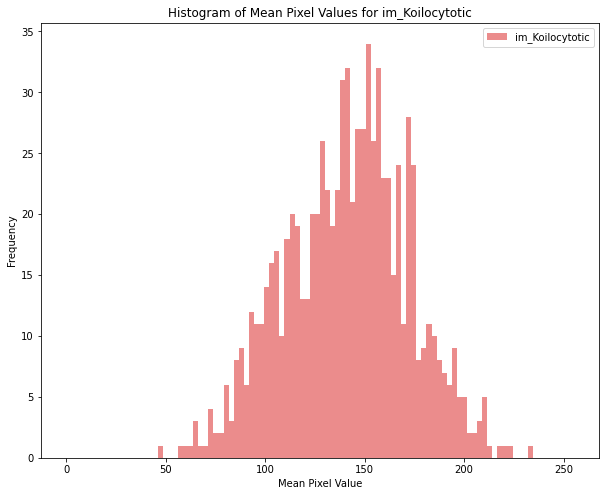

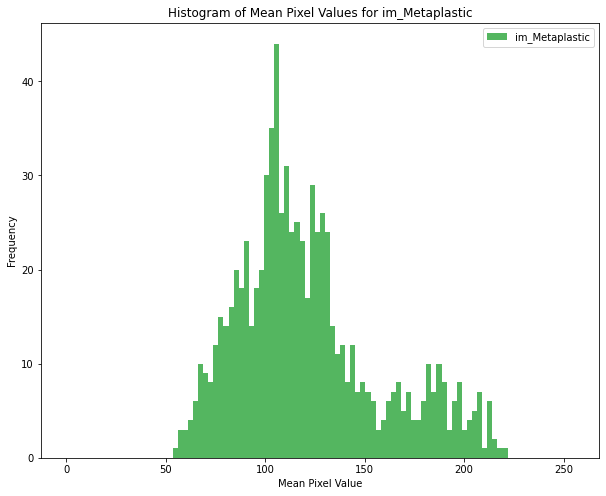

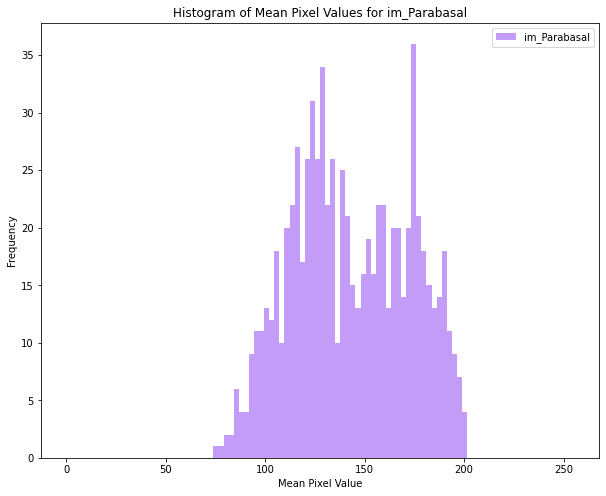

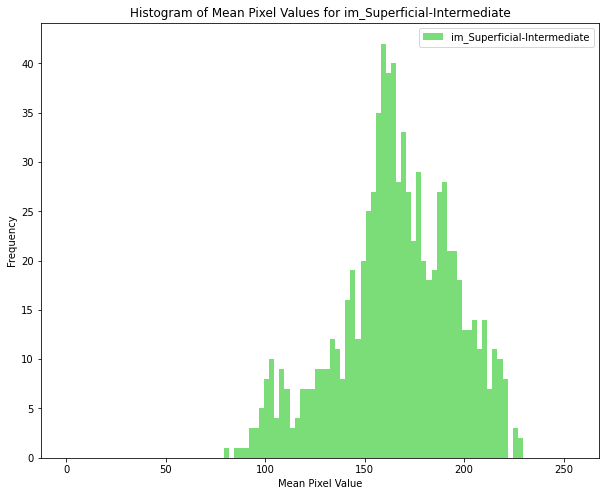

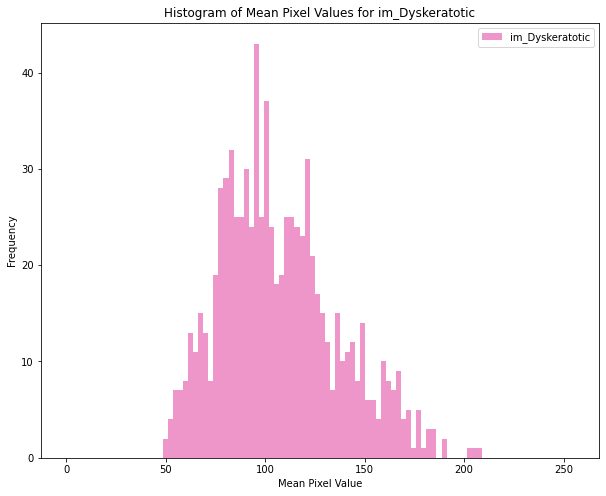

In [72]:
category_keys = list(categories_content.keys())

for category in category_keys:
  images_path = categories_content[category][IMAGE_PATH_KEY]
  images_average = ImageStatistic().intensity_distribution(np.mean, images_path)

  plt.figure(figsize=(10,8))
  plt.hist(images_average, bins=100, alpha=0.7, label=category, color=np.random.rand(3), range=(0, 255))
  plt.title(f"Histogram of Mean Pixel Values for {category}")
  plt.xlabel("Mean Pixel Value")
  plt.ylabel("Frequency")
  plt.legend()
  plt.show()

As it is shown in the above images, a qualitative interpretation of tail values allows us to say that:


*   im_Koilocytotic: The most darker images are being present up to 75 level of intensity, and the most saturated images are being present from 200
*   im_Metaplastic: The most darker images are being present up to 65 level of intensity, and the most saturated images are being present from 200
*   im_Parabasal: The most darker images are being present up to 90 level of intensity, and the most saturated images are being present from 190
*   im_Superficial-Intermediate: The most darker images are being present up to 100 level of intensity, and the most saturated images are being present from 220
*   im_Dyskeratotic: The most darker images are being present up to 60 level of intensity, and the most saturated images are being present from 175



# Analyzing the images for those intervals

In [75]:
K_class = "im_Koilocytotic"
M_class = "im_Metaplastic"
P_class = "im_Parabasal"
S_class = "im_Superficial-Intermediate"
D_class = "im_Dyskeratotic"

limit_per_class = {
    K_class: {"lowest": 75, "highest": 200},
    M_class: {"lowest": 65, "highest": 200},
    P_class: {"lowest": 90, "highest": 190},
    S_class: {"lowest": 100, "highest": 220},
    D_class: {"lowest": 60, "highest": 175}
}

In [103]:
import random 

class ImageSipakmekStatisticalPlotter():
  def __init__(self, metric, verbose=True):
    self.verbose = verbose
    self.metric = metric

  def plot_multiple_images(self, image_paths, category):
    if self.verbose:
      NUMBER_PLOT = 4

      if len(image_paths) > NUMBER_PLOT*NUMBER_PLOT:
        samples = random.sample(image_paths, NUMBER_PLOT*NUMBER_PLOT)
      else:
        samples = image_paths

      fig, axs = plt.subplots(NUMBER_PLOT, NUMBER_PLOT, figsize=(15, 15))
      index = 0 
      flag_hor = 0
      flag_ver = 0

      for path in samples:
        image = cv2.imread(path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        if flag_hor >= NUMBER_PLOT:
          flag_hor = 0
          flag_ver += 1
        
        axs[flag_ver, flag_hor].imshow(image)
        flag_hor += 1

      plt.title(f"{category}")
      plt.show()

  def get_low_values(self, image_paths, limit_per_class, category):
    print("Darker Images")
    lowest = limit_per_class[category]["lowest"]
    distribution = ImageStatistic().intensity_distribution(self.metric, image_paths)
    images_path_lowest = [image_paths[index] for index in range(distribution.shape[0]) if distribution[index] < lowest]
    self.plot_multiple_images(images_path_lowest, category)
    return images_path_lowest

  def get_high_values(self, image_paths, limit_per_class, category):
    print("Saturate Images")
    highest = limit_per_class[category]["highest"]
    distribution = ImageStatistic().intensity_distribution(self.metric, image_paths)
    images_path_saturate = [image_paths[index] for index in range(distribution.shape[0]) if distribution[index] > highest]
    self.plot_multiple_images(images_path_saturate, category)
    return images_path_saturate

  def get_common_values(self, image_paths, limit_per_class, category):
    highest = limit_per_class[category]["highest"]
    lowest = limit_per_class[category]["lowest"]
    print("Common Images")
    distribution = ImageStatistic().intensity_distribution(self.metric, image_paths)
    images_path_common = [image_paths[index] for index in range(distribution.shape[0]) if distribution[index] < highest and distribution[index] > lowest]
    self.plot_multiple_images(images_path_common, category)
    return images_path_common

In [104]:
image_statistical_plotter = ImageSipakmekStatisticalPlotter(metric=np.mean, verbose=True)

Darker Images


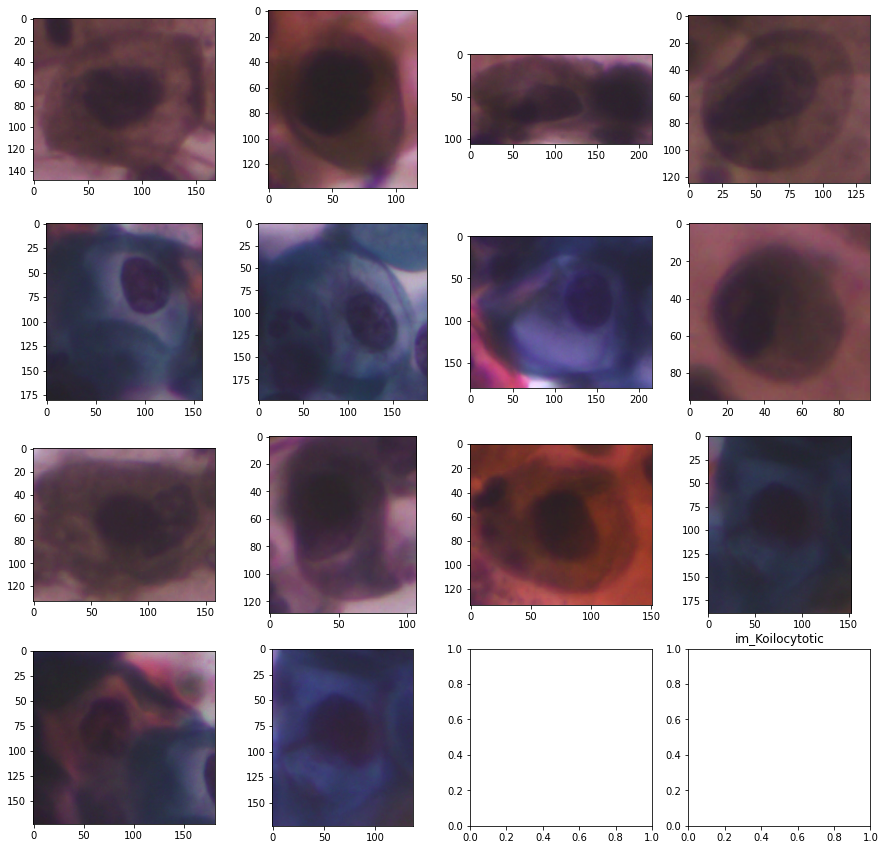

Saturate Images


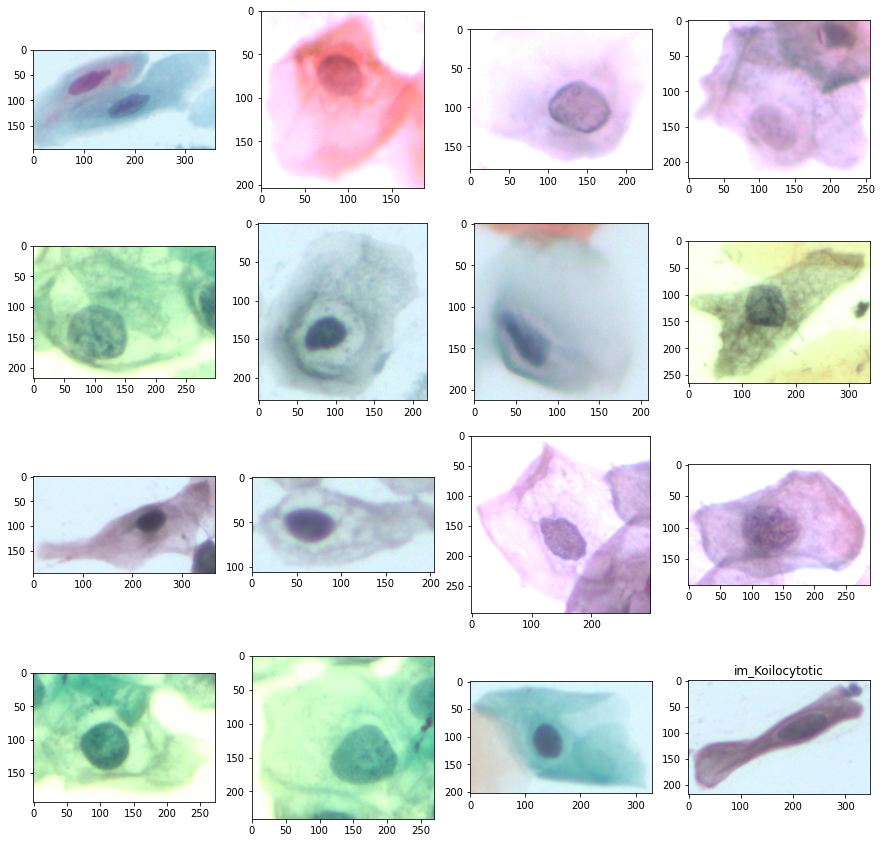

Common Images


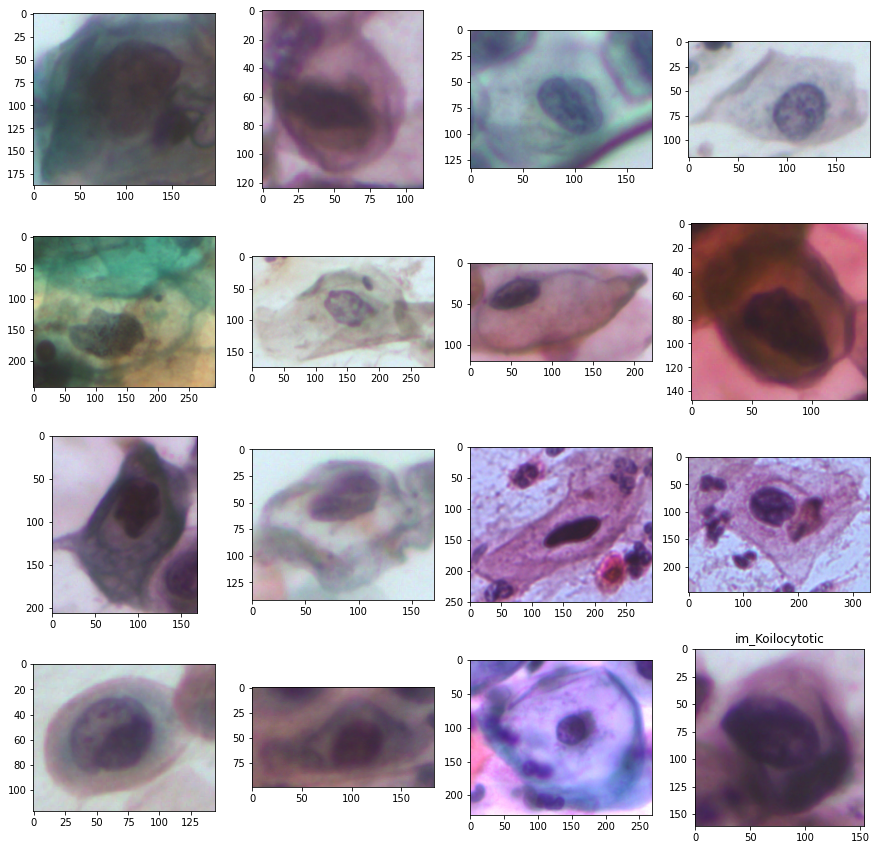

In [105]:
category = K_class
image_paths = categories_content[category][IMAGE_PATH_KEY]

images_path_lowest = image_statistical_plotter.get_low_values(image_paths, limit_per_class, category)
images_path_saturate = image_statistical_plotter.get_high_values(image_paths, limit_per_class, category)
images_path_common= image_statistical_plotter.get_common_values(image_paths, limit_per_class, category)

Darker Images


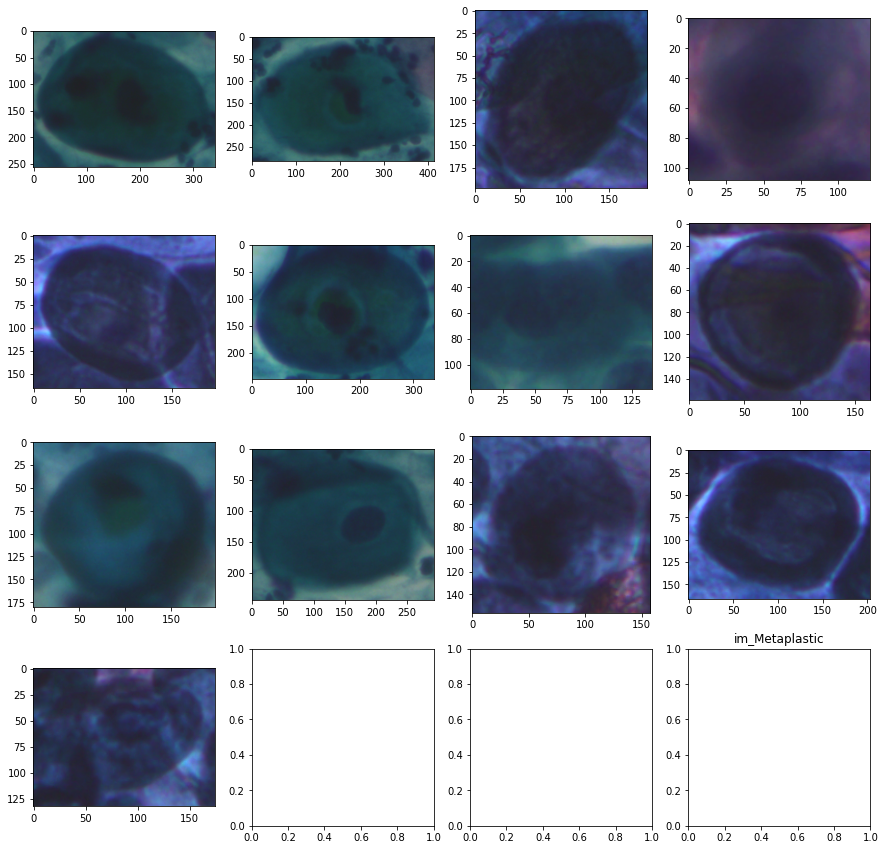

Saturate Images


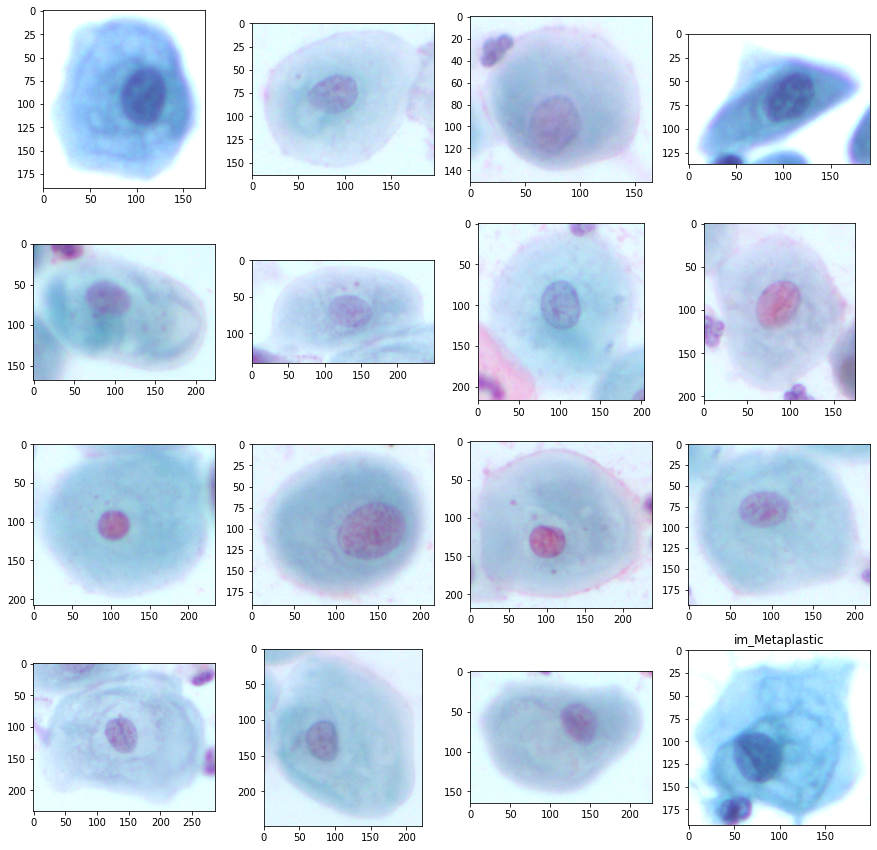

Common Images


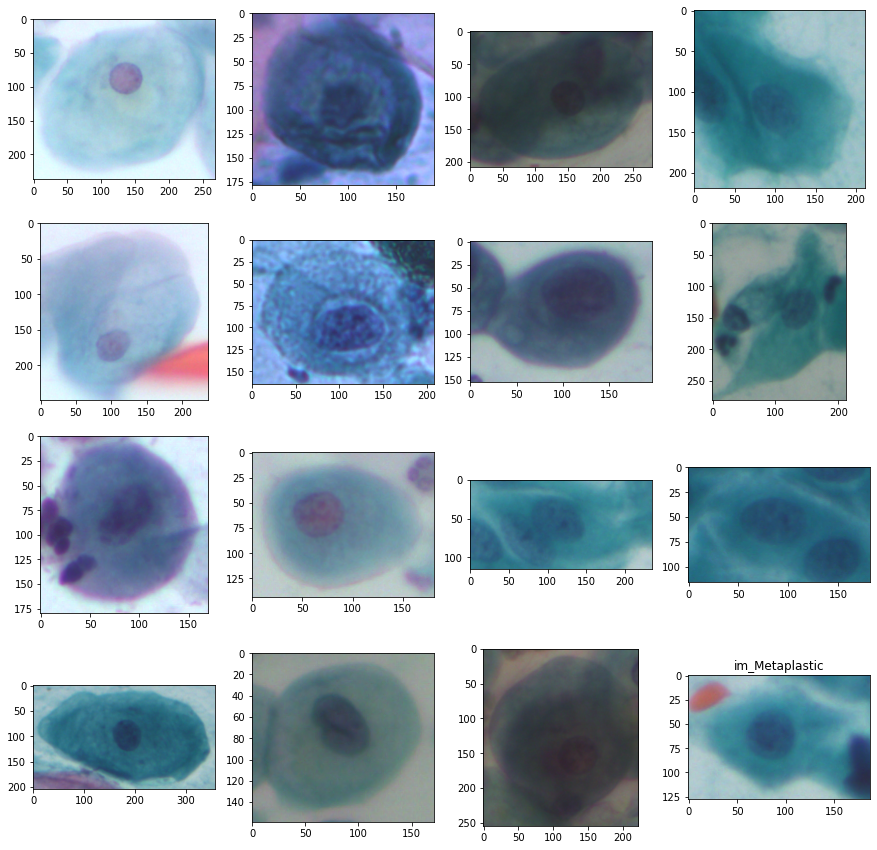

In [106]:
category = M_class
image_paths = categories_content[category][IMAGE_PATH_KEY]

images_path_lowest = image_statistical_plotter.get_low_values(image_paths, limit_per_class, category)
images_path_saturate = image_statistical_plotter.get_high_values(image_paths, limit_per_class, category)
images_path_common= image_statistical_plotter.get_common_values(image_paths, limit_per_class, category)

Darker Images


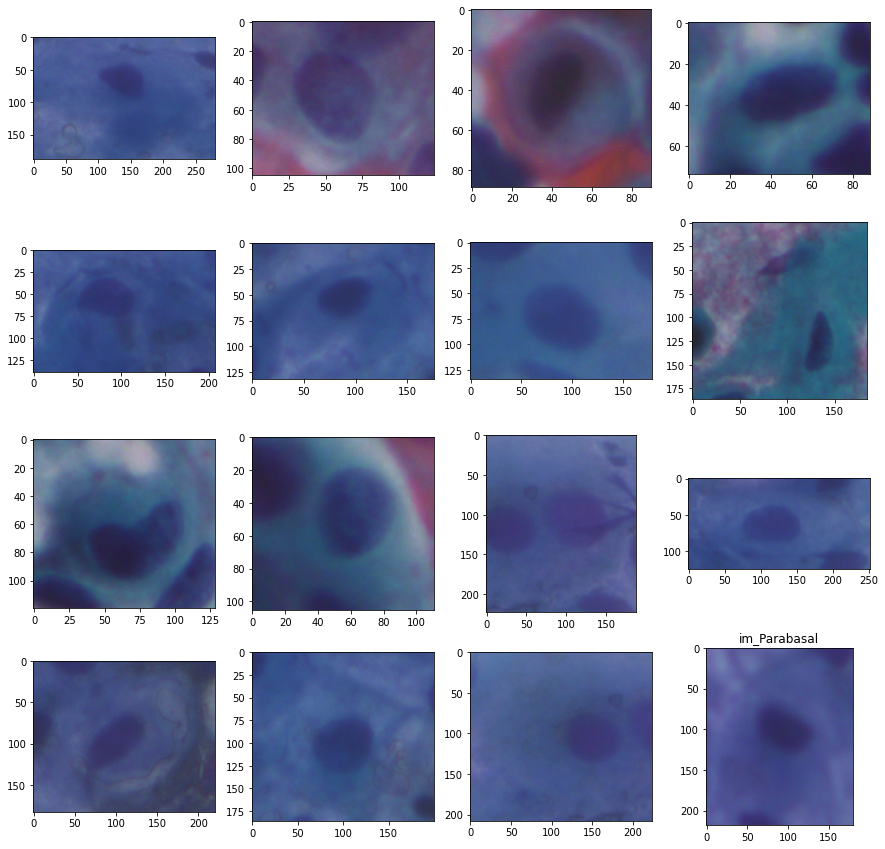

Saturate Images


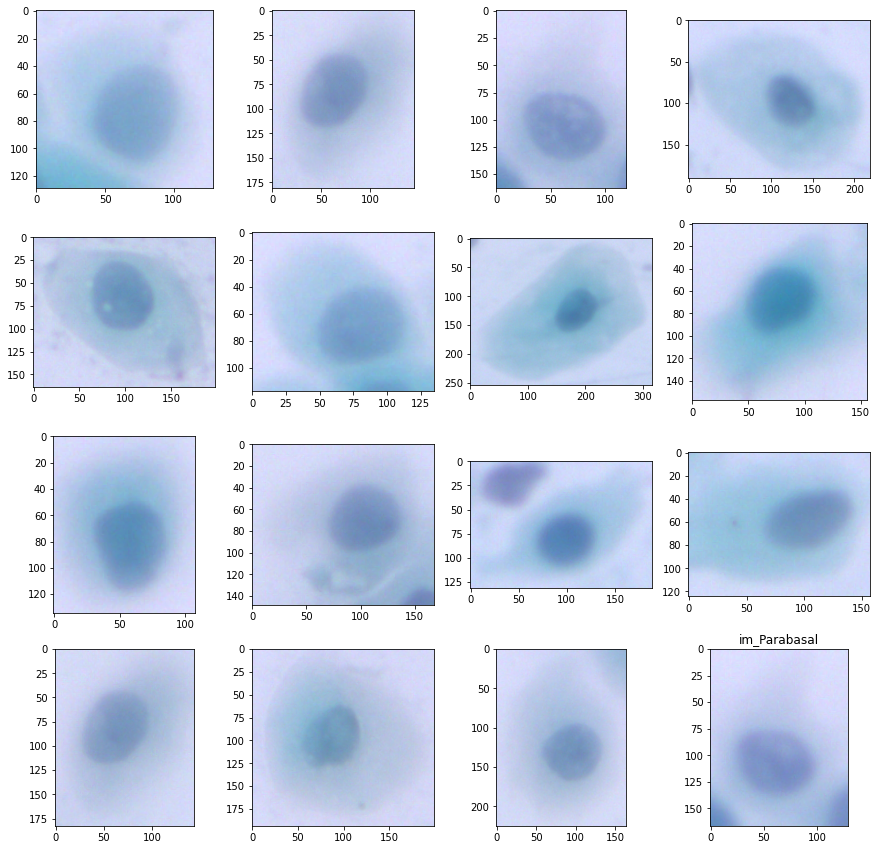

Common Images


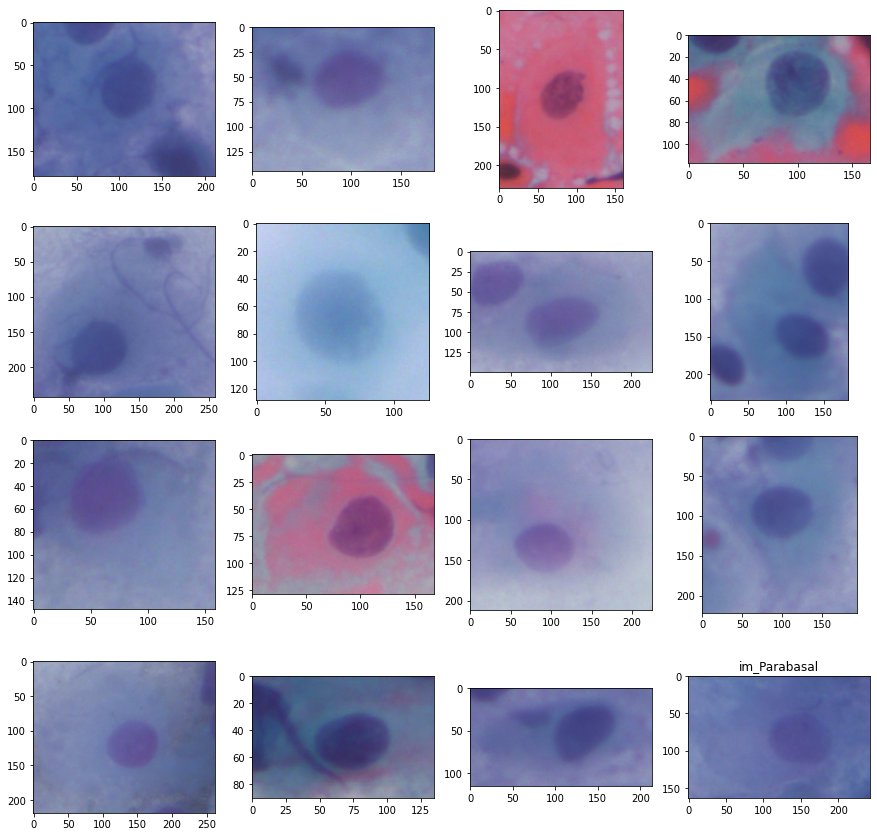

In [107]:
category = P_class
image_paths = categories_content[category][IMAGE_PATH_KEY]

images_path_lowest = image_statistical_plotter.get_low_values(image_paths, limit_per_class, category)
images_path_saturate = image_statistical_plotter.get_high_values(image_paths, limit_per_class, category)
images_path_common= image_statistical_plotter.get_common_values(image_paths, limit_per_class, category)

Darker Images


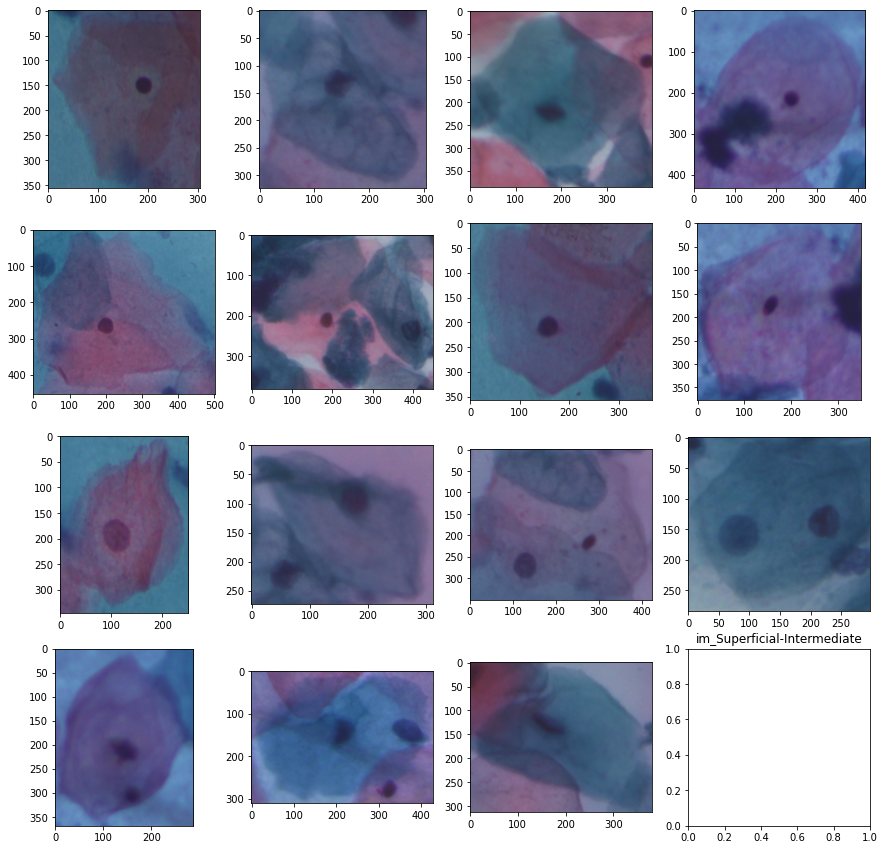

Saturate Images


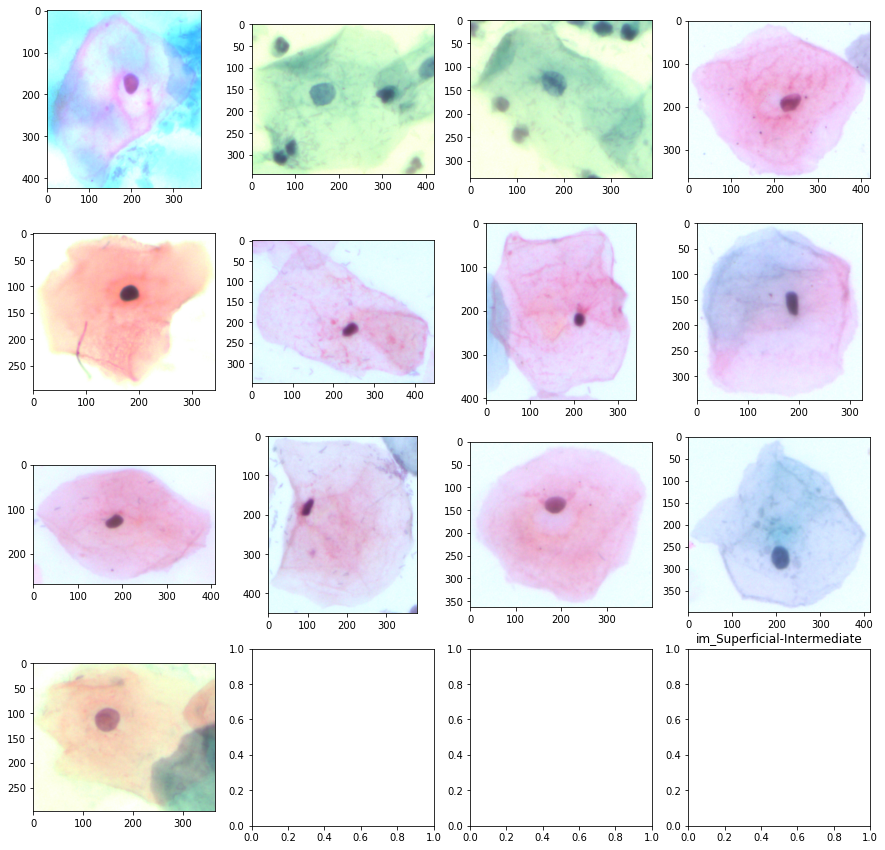

Common Images


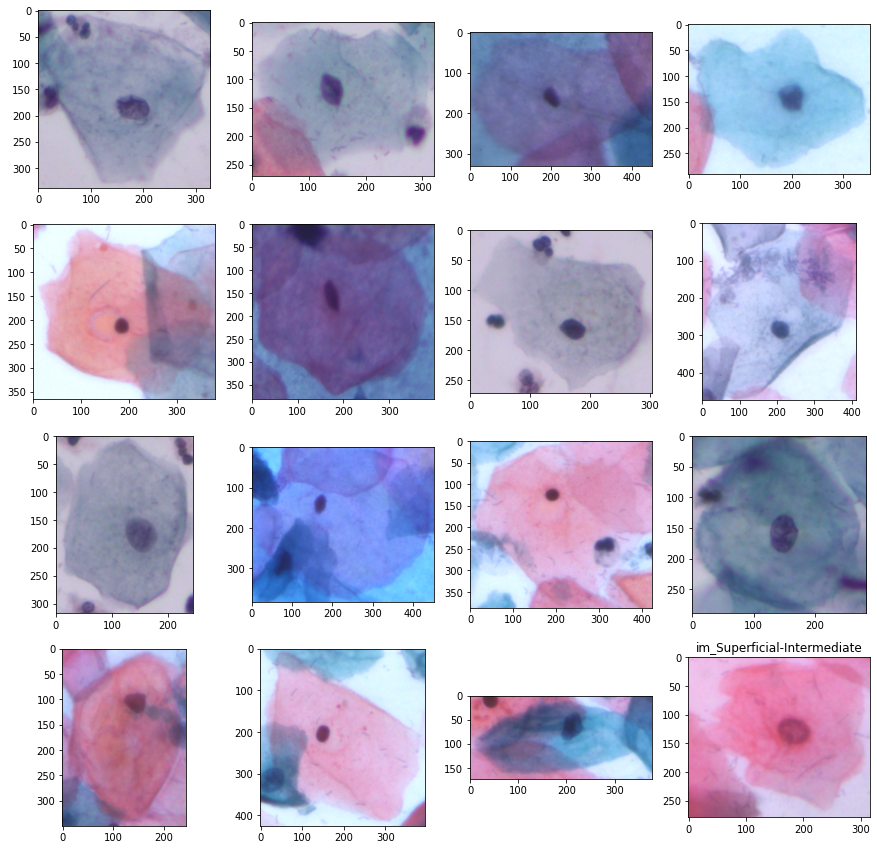

In [108]:
category = S_class
image_paths = categories_content[category][IMAGE_PATH_KEY]

images_path_lowest = image_statistical_plotter.get_low_values(image_paths, limit_per_class, category)
images_path_saturate = image_statistical_plotter.get_high_values(image_paths, limit_per_class, category)
images_path_common= image_statistical_plotter.get_common_values(image_paths, limit_per_class, category)

Darker Images


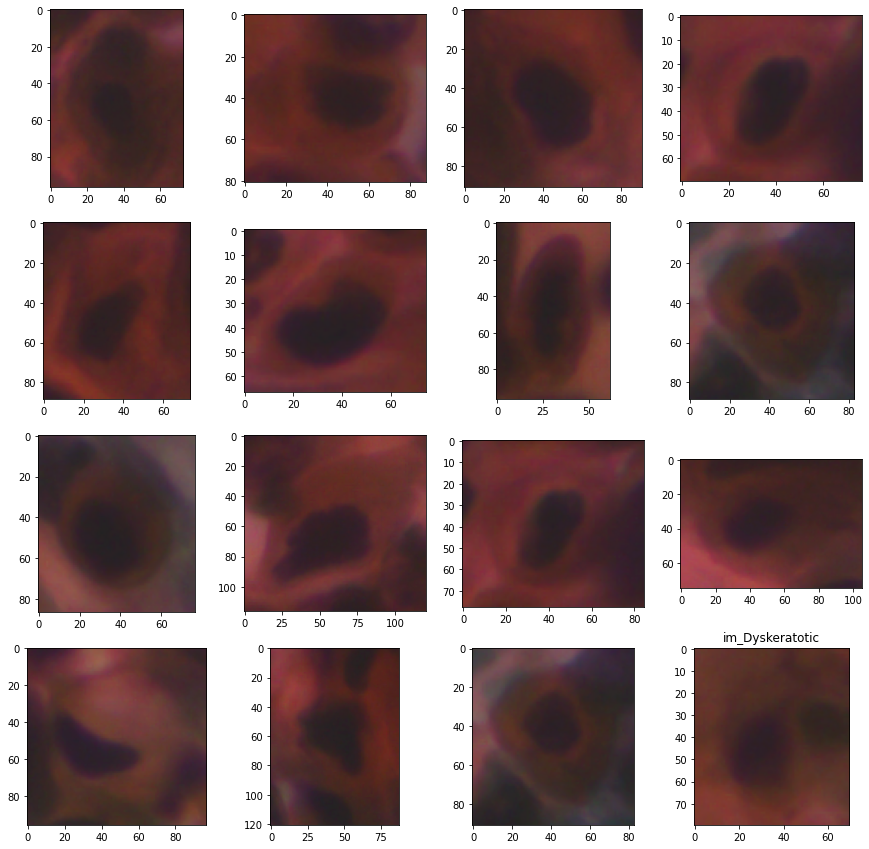

Saturate Images


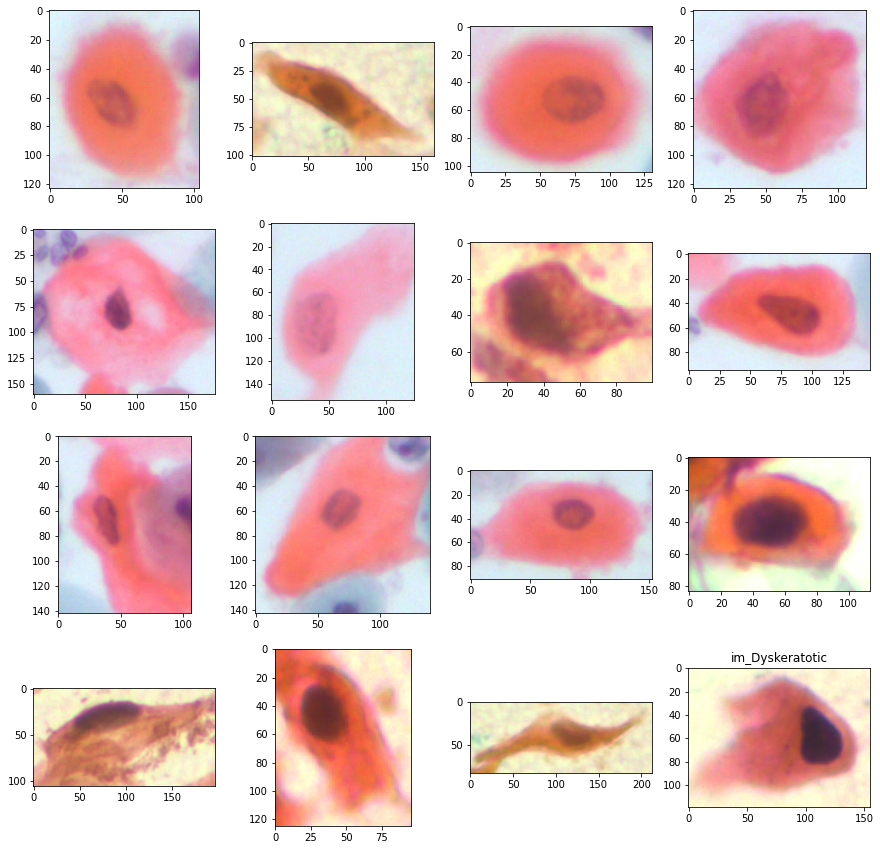

Common Images


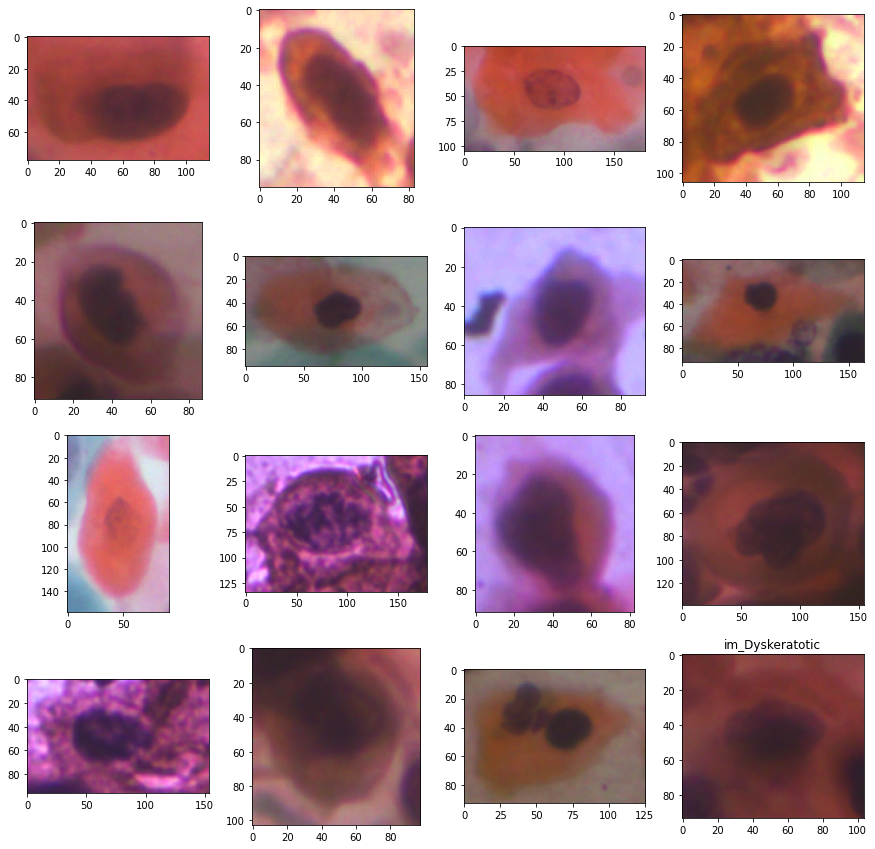

In [109]:
category = D_class
image_paths = categories_content[category][IMAGE_PATH_KEY]

images_path_lowest = image_statistical_plotter.get_low_values(image_paths, limit_per_class, category)
images_path_saturate = image_statistical_plotter.get_high_values(image_paths, limit_per_class, category)
images_path_common= image_statistical_plotter.get_common_values(image_paths, limit_per_class, category)